# China Animal Food Production

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.transforms
import seaborn as sns

%matplotlib inline

import datetime

pd.set_option('display.max_rows',500)
pd.set_option('display.max_columns',500)
pd.set_option('max_colwidth',1000)

## Read Data Frame

In [2]:
data = pd.read_csv('./data/hybrid/MeatProduction_clean.csv')
doc = pd.read_csv('./data/hybrid/MeatProduction_doc.csv')
geoname = pd.read_csv('./data/NBS/GeoNameSheet_cn.csv')

display(data.head())
display(doc)
display(geoname.head())

,Area,Year,"Stock, cattle","Stock, goat & sheep","Stock, pig","Stock, birds","Slaughtered, cattle","Slaughtered, goat & sheep","Slaughtered, pig","Slaughtered, birds","Meat Production, cattle","Meat Production, goat & sheep","Meat Production, pig","Meat Production, birds","Egg Production, birds","Milk Production, cow","Meat Yield, cattle","Meat Yield, goat & sheep","Meat Yield, pig","Meat Yield, birds","Aquatic, total","Aquatic, animals","Marine, total","Marine, capture","Marine, aquac.",Marine Fish,Marine Crustaceans,Marine Molluscs,Marine Plants,"Marine, others","Freshwater, total","Freshwater, capture","Freshwater, aquac.",Freshwater Fish,Freshwater Crustaceans,Freshwater Molluscs,"Freshwater, others"
0,"China, mainland",1961,4940.0,11281.0,8227.0,62600.0,50.6,1000.0,3300.0,54500.0,4.3,10.0,137.0,57.00,150.0,60.0,85.0,10.000000,41.5,1.045872,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"China, mainland",1962,4676.0,12387.0,7552.0,64200.0,69.0,1000.0,4300.0,56400.0,6.2,10.0,178.0,59.00,152.0,62.0,89.9,10.000000,41.4,1.046099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"China, mainland",1963,4736.0,13465.0,9997.0,66300.0,92.5,1200.0,7800.0,58000.0,8.3,12.0,330.0,60.75,154.0,63.5,89.7,10.000000,42.3,1.047414,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"China, mainland",1964,4894.0,13747.0,13180.0,68400.0,103.5,1400.0,10500.0,59400.0,9.3,14.0,450.0,62.25,158.0,64.0,89.9,10.000000,42.9,1.047980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"China, mainland",1965,5242.0,13669.0,15247.0,69000.0,116.0,1570.0,12167.0,61600.0,10.4,16.0,525.0,64.50,162.0,64.5,89.7,10.191083,43.1,1.047078,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Item-En,项目名称: Item_Cn,Explanation-En,中文解释: Explanation-Cn,Unit-En,单位: Unit-Cn,Remarek-En,备注: Remark-Cn
0,Area,地区,"Name of countries, areas or China's provinces (or provincial level areas of China)",国家、地区或中国省份（或中国省级地区）的名字；,10000 heads,万头,NaN,NaN
1,Year,年份,Years.,年份,10000 heads,万头,NaN,NaN
2,"Stock, cattle",存栏量_牛,Numbers of stocks of cattle.,牛的存栏量,10000 heads,万头,NaN,NaN
3,"Stock, goat & sheep",存栏量_山羊&绵羊,Numbers of stocks of the total of goats and sheep.,山羊和绵羊的总存栏量,10000 heads,万头,NaN,NaN
4,"Stock, pig",存栏量_猪,Numbers of stocks of pigs.,猪的存栏量,10000 heads,万头,NaN,NaN
5,"Stock, birds",存栏量_禽类,Numbers of stocks of birds.,禽类的存栏量,10000 heads,万头,"Areas data estimated by (each year's 'Slaughtered, birds' of cn / each year's 'Stock, birds' of cn) = ('Slaughtered, birds' in areas of same year / 'Stock, birds' in areas of same year).",地方数据根据 (每年全国'屠宰量_禽类' / 每年全国'存栏量_禽类' = 同年各地'屠宰量_禽类' /同年各地'存栏量_禽类') 估算
6,"Slaughtered, cattle",屠宰量_牛,Numbers of slaughtered cattle for meat.,牛的屠宰数量（出栏量）,10000 heads,万头,NaN,NaN
7,"Slaughtered, goat & sheep",屠宰量_山羊&绵羊,Numbers of slaughtered goats and sheep for meat.,山羊和绵羊的屠宰数量（出栏量）,10000 heads,万头,NaN,NaN
8,"Slaughtered, pig",屠宰量_猪,Numbers of slaughtered pigs for meat.,猪的屠宰数量（出栏量）,10000 heads,万头,NaN,NaN
9,"Slaughtered, birds",屠宰量_禽类,"Numbers of slaughtered birds for meat, mainly from chicken and duck.",禽类的屠宰数量（出栏量）,10000 heads,万头,NaN,NaN


,AreaNum,Area,Region
0,41,"China, mainland",East Asia
1,1001,Beijing,North China
2,1002,Tianjin,North China
3,1003,Hebei,North China
4,1004,Shanxi,North China


In [3]:
df = pd.merge(geoname, data, on='Area', how='outer')
df.head()

,AreaNum,Area,Region,Year,"Stock, cattle","Stock, goat & sheep","Stock, pig","Stock, birds","Slaughtered, cattle","Slaughtered, goat & sheep","Slaughtered, pig","Slaughtered, birds","Meat Production, cattle","Meat Production, goat & sheep","Meat Production, pig","Meat Production, birds","Egg Production, birds","Milk Production, cow","Meat Yield, cattle","Meat Yield, goat & sheep","Meat Yield, pig","Meat Yield, birds","Aquatic, total","Aquatic, animals","Marine, total","Marine, capture","Marine, aquac.",Marine Fish,Marine Crustaceans,Marine Molluscs,Marine Plants,"Marine, others","Freshwater, total","Freshwater, capture","Freshwater, aquac.",Freshwater Fish,Freshwater Crustaceans,Freshwater Molluscs,"Freshwater, others"
0,41,"China, mainland",East Asia,1961,4940.0,11281.0,8227.0,62600.0,50.6,1000.0,3300.0,54500.0,4.3,10.0,137.0,57.00,150.0,60.0,85.0,10.000000,41.5,1.045872,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,41,"China, mainland",East Asia,1962,4676.0,12387.0,7552.0,64200.0,69.0,1000.0,4300.0,56400.0,6.2,10.0,178.0,59.00,152.0,62.0,89.9,10.000000,41.4,1.046099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,41,"China, mainland",East Asia,1963,4736.0,13465.0,9997.0,66300.0,92.5,1200.0,7800.0,58000.0,8.3,12.0,330.0,60.75,154.0,63.5,89.7,10.000000,42.3,1.047414,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,41,"China, mainland",East Asia,1964,4894.0,13747.0,13180.0,68400.0,103.5,1400.0,10500.0,59400.0,9.3,14.0,450.0,62.25,158.0,64.0,89.9,10.000000,42.9,1.047980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,41,"China, mainland",East Asia,1965,5242.0,13669.0,15247.0,69000.0,116.0,1570.0,12167.0,61600.0,10.4,16.0,525.0,64.50,162.0,64.5,89.7,10.191083,43.1,1.047078,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
DATA_YEAR = df['Year'].unique().max()
DATA_YEAR

2017

In [5]:
plt.style.use(['ggplot'])

# font size
TIT_size = 16    # titles
LAB_size = 13    # labels
LEG_size = 13    # legends
TCK_size = 13    # ticklabels

LIN_wei = 2    # line weights
BAR_wid = 4      # bar width
GRD_wid = 0.5    # grid line width
GRD_clr = 'white' 
GRD_aph = 1     # grid alpha

CLs = ('hotpink','maroon','orangered','gold','deepskyblue','yellowgreen','darkgray','chocolate',
       'r','orange','maroon','hotpink','b','yellowgreen','deepskyblue','g','c','lightslategray','k')
MKs = ('o', 'x','o','x', 'v','.','v','.','o','x','o', 'x', 'v','.','v','.')
LSs = ('-','-','--', ':', ':','-.','-.','-','-','--','--', ':', ':','-.','-.')

# =============================================================================================================
def setX_quant(ax, ticks, step, label = ''):
    ax.set_xticks(ticks)
    ax.set_xlim(ticks[0]-step,ticks[-1]+step)
    ax.set_xticklabels(ticks, rotation=0, ha='center', fontsize=TCK_size)
    ax.set_xlabel(label, fontsize=LAB_size)
    ax.xaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
def setX_quali(ax, ticks, label = ''):
    ax.set_xticklabels(ticks, rotation=90, ha='center', fontsize=TCK_size)
    ax.set_xlabel(label, fontsize=LAB_size)
    ax.xaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)

def setY_quant(ax, y_max, label = ''):
    tick_num = 9
    step = y_max/(tick_num-1)
    min_gap = 10
    
    if step < 1:
        step = round(step,1)
        dec=1
    elif step < 10:
        step = int(step)
        dec=0
    elif step/min_gap < 10:
        step = int(step/min_gap)*10
        dec=0
    else:
        n=0
        while step/min_gap >= 10:
            step = int(step/min_gap)
            n += 1
        step = int(step/min_gap)*(min_gap**(n+1))
        dec=0
        
    y_max = step*(tick_num+1)        
    ticks = np.round(np.arange(0, y_max+step, step),decimals=dec)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1]+step)
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel(label, fontsize=LAB_size)    
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
def setY_per(ax):
    ticks=np.round(np.linspace(0, 100, num=6, endpoint=True), decimals=0)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1])
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel('Percentage (%)', fontsize=LAB_size)
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)

In [6]:
def plotPivot_Trends(
    domain,                # name of domain
    df_,                   # df of pivot contains X and Ys, (non-stacked, axis=0)
    Ys_name,                # items for plot, also column names of Ys
    X_name,                # column name of X
    X_range,               # values of X
    X_ticks,               # linspace for X axis
    fig_size = (18, 20),  
    ):
    
    fig = plt.figure(figsize = fig_size, dpi = 300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.5, hspace =0.13)
    
    title = "China's National Trends of "+domain+"\n"
    Y_lab = domain+' (10,000 t)'
    
    dfs = {}
    for n in range(len(Ys_name)):
        dfs[Ys_name[n]] = df_[[X_name,Ys_name[n]]].dropna()
    
    ax0 = fig.add_subplot(3,1,1)
    plt.title(title, fontsize=TIT_size)

    y_maxes = np.array([])
    for n in range(len(Ys_name)):
        dfs[Ys_name[n]].plot.line(x=X_name, c=CLs[n], lw=LIN_wei, ax=ax0)
        y_maxes = np.append(y_maxes,dfs[Ys_name[n]][Ys_name[n]].max())

    ax=plt.gca()
    ax.legend(labels=Ys_name, loc='center left', frameon=False, fontsize=LEG_size,
           bbox_to_anchor=(1.,0.5),borderaxespad = 0.)
    setX_quant(ax, X_ticks, step)
    setY_quant(ax, y_maxes.max(), Y_lab)
#===================================================
    ax1 = fig.add_subplot(3,1,2)

    bot=np.zeros(len(years))
    for n in range(len(Ys_name)):
        y = np.array(dfs[Ys_name[n]][dfs[Ys_name[n]][X_name].isin(X_range)][Ys_name[n]])    
        plt.bar(years, y ,bottom=bot,color=CLs[n], width=BAR_wid)
        bot=bot + y
    totals = bot

    ax=plt.gca()
    ax.legend(labels=Ys_name, loc='center left', frameon=False, fontsize=LEG_size,
           bbox_to_anchor=(1.,0.5),borderaxespad = 0.)
    setX_quant(ax, X_ticks, step)
    setY_quant(ax, totals.max(), Y_lab)
#====================================================
    ax2 = fig.add_subplot(3,1,3)

    bot=np.zeros(len(years))
    for n in range(len(Ys_name)):
        y = np.array(dfs[Ys_name[n]][dfs[Ys_name[n]][X_name].isin(X_range)][Ys_name[n]])/totals*100
        plt.bar(years, y ,bottom=bot,color=CLs[n], width=BAR_wid)
        bot = bot+y

    ax=plt.gca()
    ax.legend(labels=Ys_name, loc='center left', frameon=False, fontsize=LEG_size,
           bbox_to_anchor=(1.,0.5),borderaxespad = 0.)
    
    setX_quant(ax, X_ticks, step)
    setY_per(ax)
    
    img='./results/img/'+'CN_AnimalProduction_'+'National Trends of '+domain+'.png'
    bbox = matplotlib.transforms.Bbox([[-0, -0], [15, 15]])
    fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

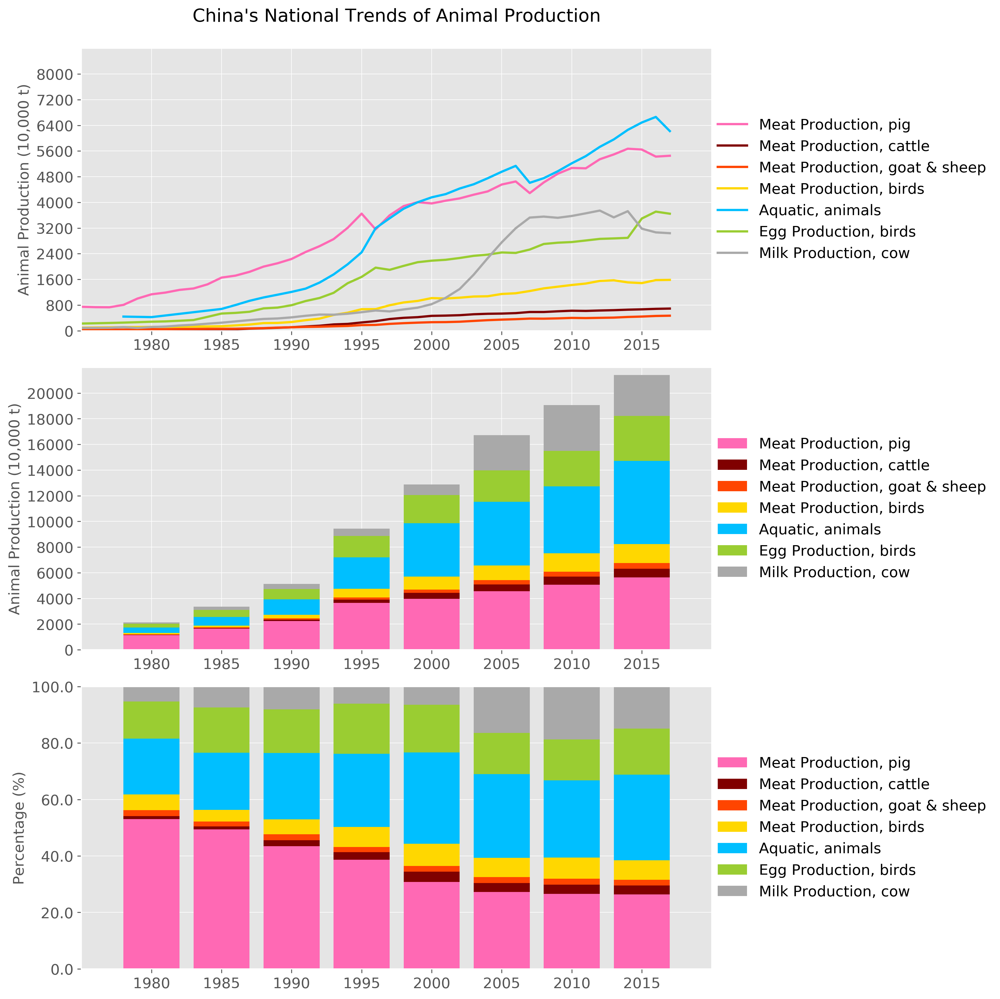

In [13]:
domain = 'Animal Production'
df_cn = df[df['Area']=='China, mainland']
items = ['Meat Production, pig','Meat Production, cattle', 'Meat Production, goat & sheep','Meat Production, birds', 
         'Aquatic, animals', 'Egg Production, birds','Milk Production, cow']

X_min = 1980
X_max = 2020
step = 5
years = list(range(1980,2020,5))

plotPivot_Trends(
    domain=domain,                # name of domain
    df_=df_cn,                   # df of pivot contains X and Ys, (non-stacked, axis=0)
    Ys_name=items,                # items for plot, also column names of Ys
    X_name='Year',                # column name of X
    X_range=years,               # values of X
    X_ticks=years,               # linspace for X axis
    fig_size = (10, 15))

In [7]:
def mkPivot(df_, item, sort_col):
    years = range(2000,DATA_YEAR)
    # make a pivot DataFrame for 'val_col': areas as index, years as columns
    
    df_ = df_.copy()
    df_ = df_[(~df_['Area'].isin(['China, mainland'])) & (df_['Year'].isin(years))]
    df_ = pd.pivot_table(df_,index=['Area'],columns=['Year'],values=[item],aggfunc=[np.sum],margins=1)
    
    # flat multi-index
    df_.columns.set_names([None, None, None], inplace=True)    # reset multi index name
    df_.columns = df_.columns.get_level_values(-1)
    
    # fix the columns order and name
    fixed_columns = [df_.columns[-1]] + list(df_.columns[:-1])
    df_ = df_[fixed_columns]
    df_.rename(columns = {'All':'Historical Total'}, inplace=True)
    df_ = df_.drop(index = 'All')
    
    # sort areas by the total number of history
    sorted_df = df_.sort_values([sort_col], ascending=False, axis=0)
    sorted_df = sorted_df.reset_index()
    return sorted_df

In [8]:
def barAreasProduction():
    colors = ['cyan', 'c', 'darkcyan','g']
    years = list(range(2000, DATA_YEAR, 5))

    items = ['Meat Production, pig','Meat Production, cattle', 'Meat Production, goat & sheep','Meat Production, birds', 
         'Aquatic, animals', 'Egg Production, birds','Milk Production, cow']

    fig = plt.figure(figsize = (18,40), dpi = 300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.2, hspace =1)

    n=0
    for i in items:
        df_ = mkPivot(df,i,'Historical Total')

        
        n+=1
        fig.add_subplot(len(items),1,n)

        title = "{} in Different Areas\n".format(i)
        plt.title(title, fontsize=TIT_size)
        print(i)
        display(df_[['Area']+years].head())
        df_[['Area']+years].plot.bar(x='Area', width=1, color=colors, ax=plt.gca())

        ax=plt.gca()
        Y_max=df_[years].values.max()
        setY_quant(ax, 1.2*Y_max, 'Production Weight (10,000 t)')
        X_ticks=df_['Area'].values
        setX_quali(ax,X_ticks)

    img='./results/img/'+'CN_AnimalProduction_'+'Different Areas '+domain+'.png'
    bbox = matplotlib.transforms.Bbox([[-0, -0], [18, 40]])
    fig.tight_layout()
    fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

In [80]:
barAreasProduction()

Meat Production, pig


,Area,2000,2005,2010,2015
0,Sichuan,419.1007,513.68700,492.213873,512.416541
1,Hunan,371.7571,436.96840,412.411923,448.021800
2,Henan,322.8812,440.82520,408.291177,467.962000
3,Shandong,285.8800,367.05339,353.209893,397.443600
4,Hebei,242.8362,337.36960,245.191462,275.031204


Meat Production, cattle


,Area,2000,2005,2010,2015
0,Henan,83.0000,100.783000,83.046330,82.600000
1,Shandong,69.1800,80.721967,68.656879,67.871439
2,Hebei,65.2916,86.859300,58.081073,53.190669
3,Jilin,33.5449,51.002300,43.241880,46.588147
4,Neimenggu,21.8440,33.597300,49.708380,52.894979


Meat Production, goat & sheep


,Area,2000,2005,2010,2015
0,Neimenggu,31.8166,72.43180,89.200000,92.591769
1,Xinjiang,37.4966,59.89000,46.950000,55.433086
2,Shandong,24.8000,36.35506,32.670000,37.092092
3,Henan,32.0000,46.66120,25.200000,25.900000
4,Hebei,24.5944,33.72790,29.305334,31.672589


Meat Production, birds


,Area,2000,2005,2010,2015
0,Shandong,146.459191,232.927694,219.076509,237.322704
1,Guangdong,124.652149,135.527073,152.580940,130.702700
2,Henan,58.858851,92.932252,114.171988,122.822978
3,Jiangsu,76.840229,82.784727,107.918816,98.656568
4,Liaoning,51.032686,73.462818,96.561225,116.039206


Aquatic, animals


,Area,2000,2005,2010,2015
0,Shandong,652.3496,682.3286,730.7784,864.5306
1,Guangdong,590.7747,691.3175,722.4278,849.9246
2,Fujian,496.1104,555.3856,527.0210,644.2178
3,Zhejiang,466.7919,480.3070,473.5031,592.6878
4,Jiangsu,307.9486,386.7872,457.4495,518.1195


Egg Production, birds


,Area,2000,2005,2010,2015
0,Shandong,366.2,441.8334,384.282945,423.900000
1,Hebei,357.0,458.9667,339.083517,373.594184
2,Henan,270.0,375.3000,388.592750,410.000000
3,Liaoning,140.3,224.0456,275.725656,276.500000
4,Jiangsu,181.4,182.0050,190.570800,196.230000


Milk Production, cow


,Area,2000,2005,2010,2015
0,Neimenggu,79.7774,691.0481,905.177130,803.20000
1,Heilongjiang,154.2992,440.2393,552.491500,570.47834
2,Hebei,84.1984,340.3456,439.761000,473.13690
3,Shandong,45.7300,187.0747,253.051181,275.38000
4,Henan,16.0972,104.0000,290.911512,342.20000


In [9]:
import folium
from folium import plugins
import json
import time

cn_geo = r'cn_provinces.geojson'
items = ['Meat Production, pig','Meat Production, cattle', 'Meat Production, goat & sheep','Meat Production, birds', 
         'Aquatic, animals', 'Egg Production, birds','Milk Production, cow']

def mkMap(df_, item, year, color):

    df_=df_.copy()
    df_=df_[(df_['Year']==year) & (~df_['Area'].isin(['China, mainland']))][['Area',item]]
    df_sorted = df_.sort_values([item],ascending=False).reset_index().drop(columns=['index'])
    display(df_sorted)
#     print(df_sorted.Area.values)
    
    threshold_scale = np.linspace(df_[item].values.min(),
                                  df_[item].values.max(),
                                  6, dtype=int)
    # change the numpy array to a list
    threshold_scale = threshold_scale.tolist()
    # make sure that the last value of the list is greater than the maximum immigration
    threshold_scale[-1] = threshold_scale[-1] + 1

    # let Folium determine the scale.
    cn_map = folium.Map(
        width=1000,height=600,
        location=[40, 105], 
        zoom_start=4, 
        tiles='Mapbox Bright')

    cn_map.choropleth(
        geo_data=cn_geo,
        data=df_,
        columns=['Area', item],
        key_on='feature.properties.NAME',   # must be 'feature', not 'features'
        threshold_scale=threshold_scale,
        fill_color=color, 
        fill_opacity=0.9, 
        line_opacity=0.2,
        highlight=True,
        legend_name=item + ', in '+str(year)+', Unit: '+'10,000 t',
        reset=True
    )
    print(item,year)
    display(cn_map)
    cn_map.save('./results/map/'+'CN_AnimalProduction_'+item+'.html')

In [82]:
for i in items:
    mkMap(df_=df, item=i, year=2016, color='GnBu')

,Area,"Meat Production, pig"
0,Sichuan,494.481962
1,Henan,450.647406
2,Hunan,434.800000
3,Shandong,383.533074
4,Hubei,322.169706
5,Yunnan,283.676548
6,Hebei,265.405112
7,Guangdong,264.384323
8,Guangxi,249.752958
9,Anhui,244.855654


Meat Production, pig 2016


,Area,"Meat Production, cattle"
0,Henan,83.013000
1,Shandong,66.989110
2,Neimenggu,55.592623
3,Hebei,54.254482
4,Jilin,47.100617
5,Heilongjiang,42.535908
6,Xinjiang,42.479069
7,Liaoning,41.598910
8,Sichuan,36.858164
9,Yunnan,35.241882


Meat Production, cattle 2016


,Area,"Meat Production, goat & sheep"
0,Neimenggu,98.980602
1,Xinjiang,58.315606
2,Shandong,38.390316
3,Hebei,32.365607
4,Sichuan,26.887299
5,Henan,26.443900
6,Gansu,21.050000
7,Anhui,17.347000
8,Yunnan,15.133360
9,Heilongjiang,12.810000


Meat Production, goat & sheep 2016


,Area,"Meat Production, birds"
0,Shandong,251.986601
1,Guangdong,130.659366
2,Henan,125.331760
3,Liaoning,122.920646
4,Guangxi,110.329111
5,Anhui,104.841453
6,Jiangsu,95.873162
7,Sichuan,90.929118
8,Hebei,81.531919
9,Fujian,76.554201


Meat Production, birds 2016


,Area,"Aquatic, animals"
0,Shandong,882.7189
1,Guangdong,865.1502
2,Fujian,669.6295
3,Zhejiang,599.0275
4,Jiangsu,517.7374
5,Liaoning,517.4836
6,Hubei,470.8394
7,Guangxi,361.7653
8,Jiangxi,271.6146
9,Hunan,269.5681


Aquatic, animals 2016


,Area,"Egg Production, birds"
0,Shandong,440.592429
1,Henan,422.500000
2,Hebei,388.537951
3,Liaoning,287.600000
4,Jiangsu,198.500000
5,Hubei,167.770000
6,Sichuan,148.120225
7,Anhui,139.549200
8,Jilin,114.440763
9,Heilongjiang,106.250000


Egg Production, birds 2016


,Area,"Milk Production, cow"
0,Neimenggu,734.124800
1,Heilongjiang,545.947772
2,Hebei,440.490454
3,Henan,326.801000
4,Shandong,268.395660
5,Xinjiang,156.081540
6,Liaoning,143.055000
7,Shaanxi,140.201670
8,Ningxia,139.465410
9,Shanxi,95.088294


Milk Production, cow 2016


In [42]:
top_pig={'Sichuan', 'Henan', 'Hunan', 'Shandong', 'Hubei'}
top_cattle={'Henan', 'Shandong', 'Neimenggu', 'Hebei'}
top_shp_gt={'Neimenggu', 'Xinjiang'}

top_poultry={'Shandong', 'Guangdong', 'Henan', 'Liaoning', 'Guangxi', 'Anhui'}
top_aquatic={'Shandong', 'Guangdong', 'Fujian', 'Zhejiang'}

top_egg={'Shandong', 'Henan', 'Hebei', 'Liaoning'}
top_milk={'Neimenggu', 'Heilongjiang', 'Hebei', 'Henan'}

In [57]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2, venn3, venn3_circles

def drawVenn2(set1,set2,set1_name,set2_name):
    fig_size = (10, 5)
    fig = plt.figure(figsize=fig_size, dpi=300)
    v0 = venn2([set1, set2], (set1_name, set2_name))

    try:
        v0.get_patch_by_id('10').set_color('red')
    except:pass
    try:
        v0.get_patch_by_id('01').set_color('blue')
    except:pass
    try:
        v0.get_patch_by_id('11').set_color('purple')
    except:pass

    try:
        v0.get_label_by_id('10').set_text('\n\n '.join(set1.difference(set2)))
    except:pass
    try:
        v0.get_label_by_id('01').set_text('\n\n '.join(set2.difference(set1)))
    except:pass
    try:
        v0.get_label_by_id('11').set_text('\n\n '.join(set1.intersection(set2)))
    except:pass

    for text in v0.subset_labels:
        try:
            text.set_fontsize(13)
        except:
            continue

    for text in v0.set_labels:
        try:
            text.set_fontsize(13)
        except:
            continue
    
    img='./results/img/'+'CN_AnimalProduction_'+'venn_'+set1_name+' '+set2_name+'.png'
    fig.savefig(img)
    
def drawVenn3(set1, set2, set3, set1_name, set2_name, set3_name):
    fig_size = (10, 5)
    fig = plt.figure(figsize=fig_size, dpi=300)
    v1 = venn3([set1, set2, set3], (set1_name, set2_name, set3_name))

    try:
        v1.get_patch_by_id('100').set_color('red')
    except:pass
    try:
        v1.get_patch_by_id('010').set_color('yellow')
    except:pass
    try:
        v1.get_patch_by_id('001').set_color('blue')
    except:pass
    try:    
        v1.get_patch_by_id('110').set_color('orange')
    except:pass
    try:    
        v1.get_patch_by_id('101').set_color('purple')
    except:pass
    try:    
        v1.get_patch_by_id('011').set_color('green')
    except:pass
    try:    
        v1.get_patch_by_id('111').set_color('grey')
    except:pass

    try:    
        v1.get_label_by_id('100').set_text('\n\n\n\n'+'\n\n '.join(set1.difference(set2.union(set3))))
    except:pass  
    try:
        v1.get_label_by_id('010').set_text('\n\n '.join(set2.difference(set1.union(set3)))+'\n\n\n\n')
    except:pass
    try:
        v1.get_label_by_id('001').set_text('\n\n '.join(set3.difference(set2.union(set1))))
    except:pass
    try:
        v1.get_label_by_id('110').set_text('\n\n '.join((set1.intersection(set2)).difference(set3)))
    except:pass
    try:
        v1.get_label_by_id('101').set_text('\n\n '.join((set1.intersection(set3)).difference(set2)))
    except:pass
    try:
        v1.get_label_by_id('011').set_text('\n\n '.join((set3.intersection(set2)).difference(set1)))
    except:pass
    try:
        v1.get_label_by_id('111').set_text('\n\n '.join(((set1.intersection(set2)).intersection(set3))))
    except:pass

    for text in v1.subset_labels:
        try:
            text.set_fontsize(13)
        except:continue

    for text in v1.set_labels:
        try:
            text.set_fontsize(13)
        except:continue
    
    img='./results/img/'+'CN_AnimalProduction_'+'venn_'+set1_name+' '+set2_name+' '+set3_name+'.png'
    fig.savefig(img)

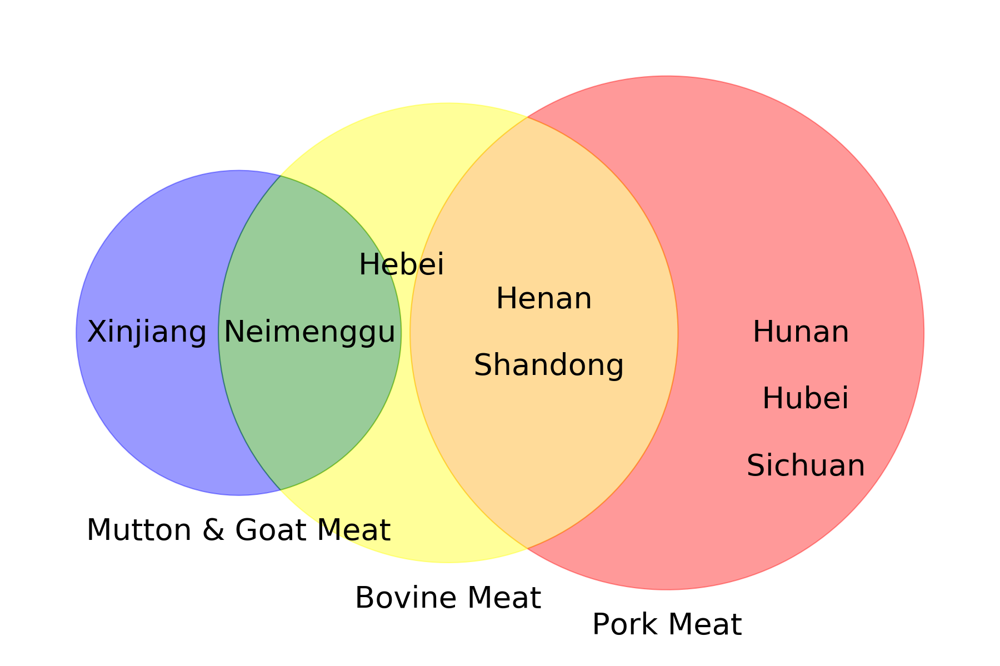

In [58]:
set1=top_pig
set2=top_cattle
set3=top_shp_gt
set1_name='Pork Meat'
set2_name='Bovine Meat'
set3_name='Mutton & Goat Meat'

drawVenn3(set1, set2, set3, set1_name, set2_name, set3_name)

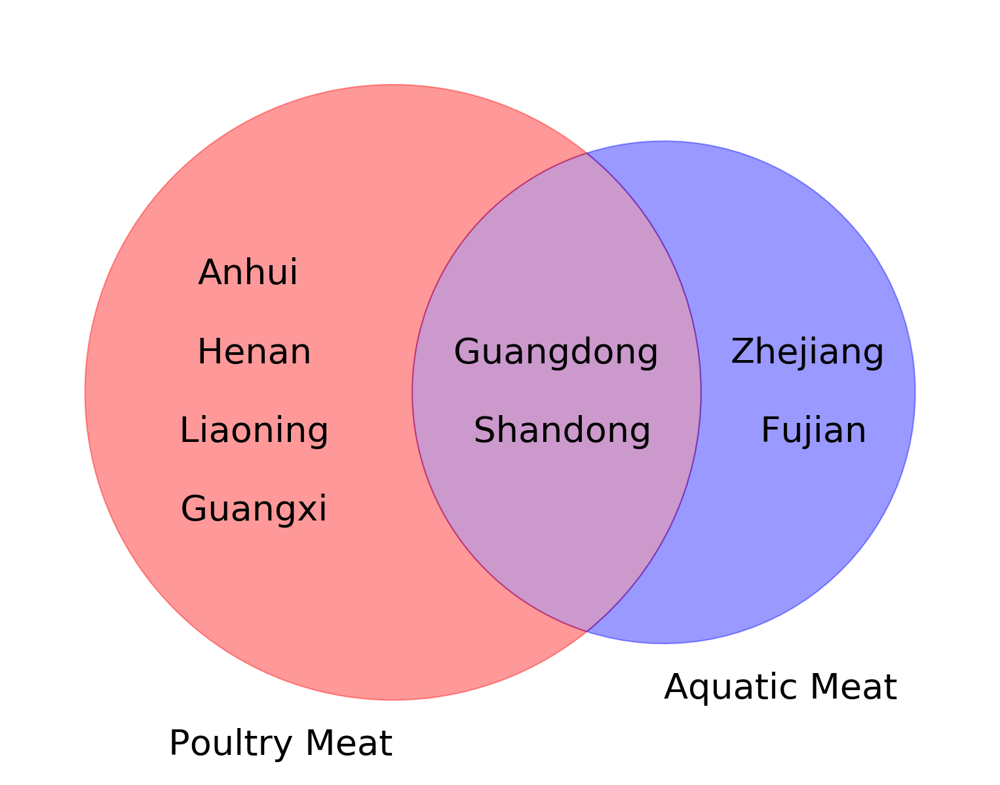

In [59]:
set1=top_poultry
set2=top_aquatic
set1_name='Poultry Meat'
set2_name='Aquatic Meat'

drawVenn2(set1,set2,set1_name,set2_name)

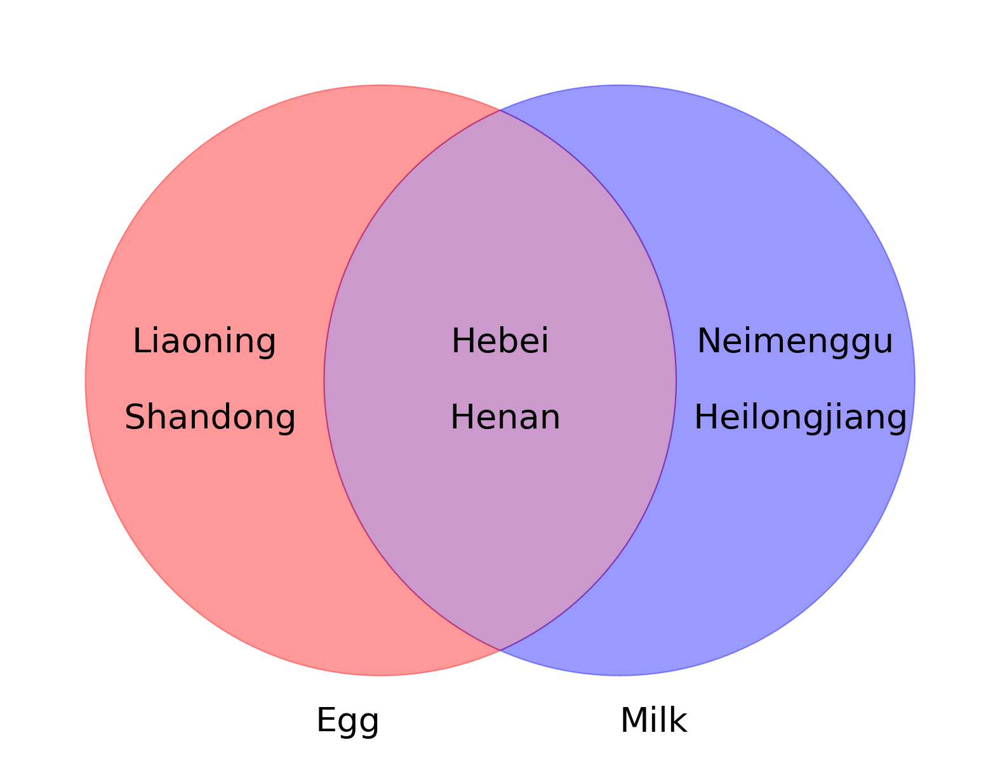

In [60]:
set1=top_egg
set2=top_milk
set1_name='Egg'
set2_name='Milk'

drawVenn2(set1,set2,set1_name,set2_name)

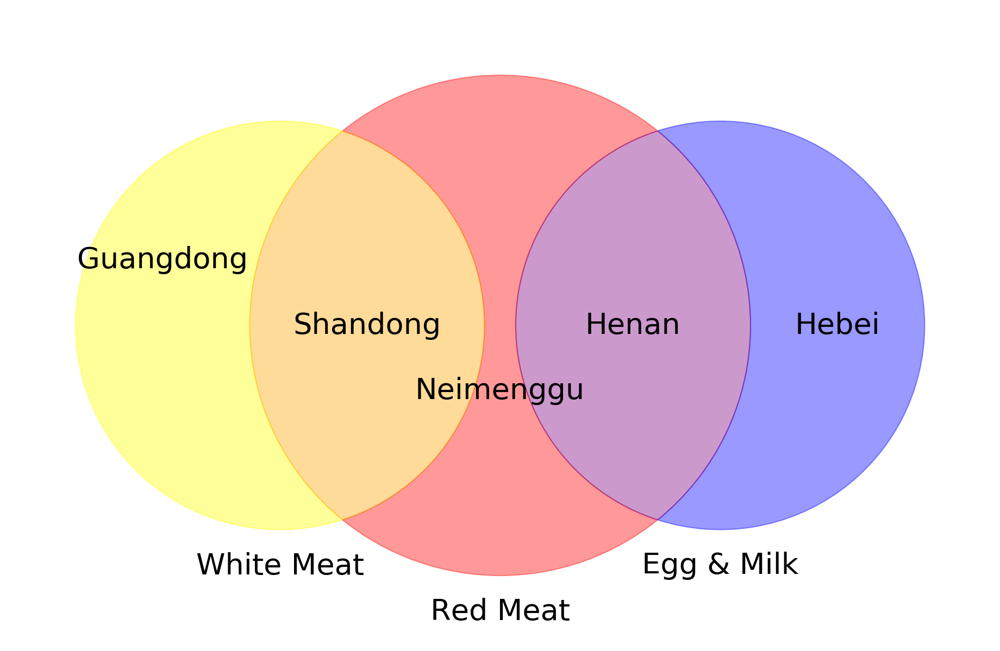

In [61]:
top_red={'Shandong','Henan','Neimenggu'}
top_white={'Guangdong', 'Shandong'}
top_egg_milk={'Hebei', 'Henan'}

set1=top_red
set2=top_white
set3=top_egg_milk
set1_name='Red Meat'
set2_name='White Meat'
set3_name='Egg & Milk'
drawVenn3(set1,set2,set3,set1_name,set2_name,set3_name)

In [10]:
def drawOutputs(df_, area, item):

    item11 = 'Stock, '+item
    item12 = 'Slaughtered, '+item
    item2 = 'Meat Production, '+item
    item3 = 'Meat Yield, '+item
    
    df_=df_.copy()
    res = df_[df_['Area']==area][['Year',item11,item12,item2,item3]]
    
    fig, ax = plt.subplots(figsize=(10,5), dpi = 300)
    
    ax2, ax3=ax.twinx(),ax.twinx()
    rspine = ax3.spines['right']
    rspine.set_position(('axes', 1.2))
    ax3.set_frame_on(True)
    ax3.patch.set_visible(False)
    fig.subplots_adjust(right=0.75)
    
    res[['Year',item11,item12]].plot(x='Year', ax=ax)
    ax.legend(loc = 'upper left')
    Y_max=res[[item11,item12]].values.max()
    setY_quant(ax, 1.5*Y_max, 'Number of Animals (10,000 heads)')
    X_step=10
    setX_quant(ax, range(1965,2025,X_step),X_step)

    res[['Year',item2]].plot(x='Year', c='green', ls=':', ax=ax2)
    ax2.legend(loc = 'upper right')
    Y_max=res[[item2]].values.max()
    setY_quant(ax2,1.1*Y_max , 'Weight of Production (10,000 t)')
    
    res[['Year',item3]].plot(x='Year', c='orange', ls='-.', ax=ax3)
    ax3.legend(loc = 'lower right')
    Y_max=res[[item3]].values.max()
    setY_quant(ax3, 1.1*Y_max, 'Meat Yield (kg/head)')
    
    img='./results/img/'+'CN_AnimalProduction_'+'productivity_'+item+'.png'
    bbox = matplotlib.transforms.Bbox([[-0, -0], [10, 5]])
    fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

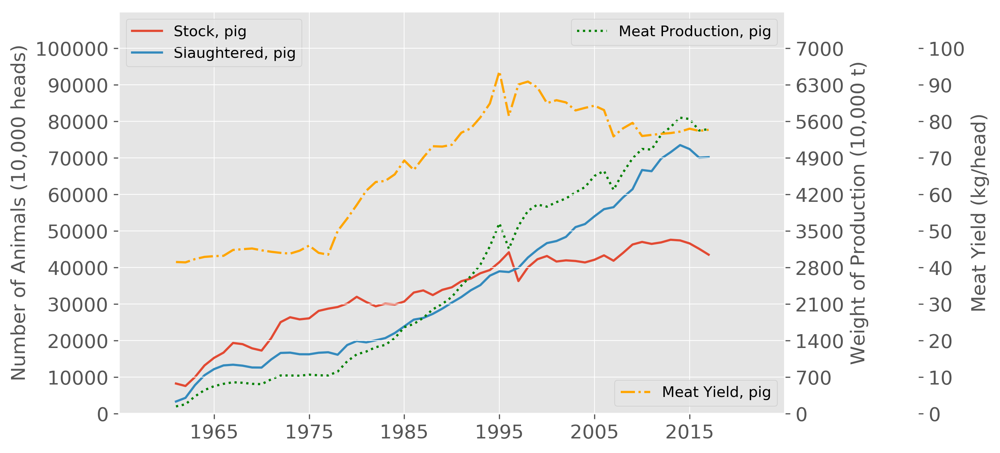

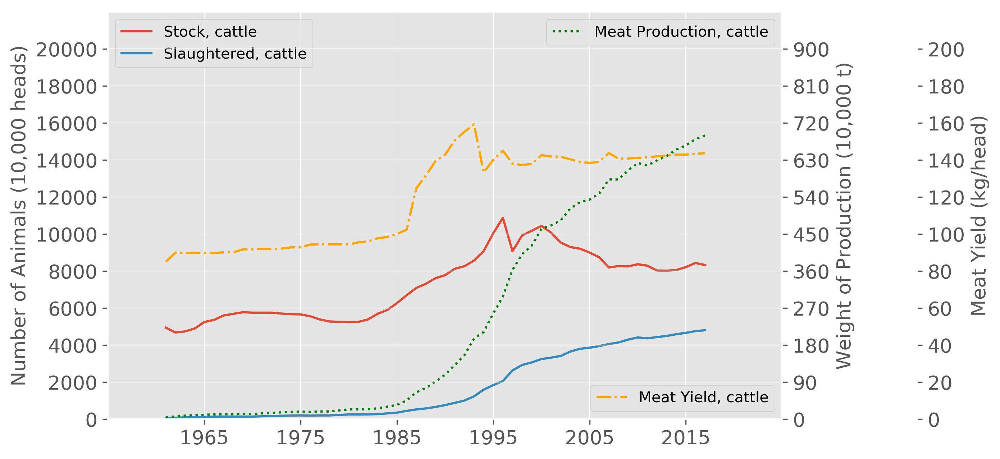

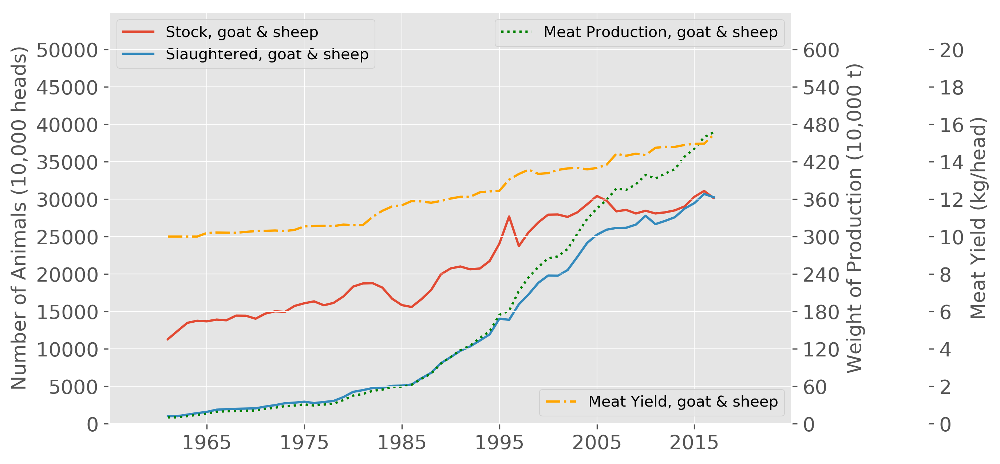

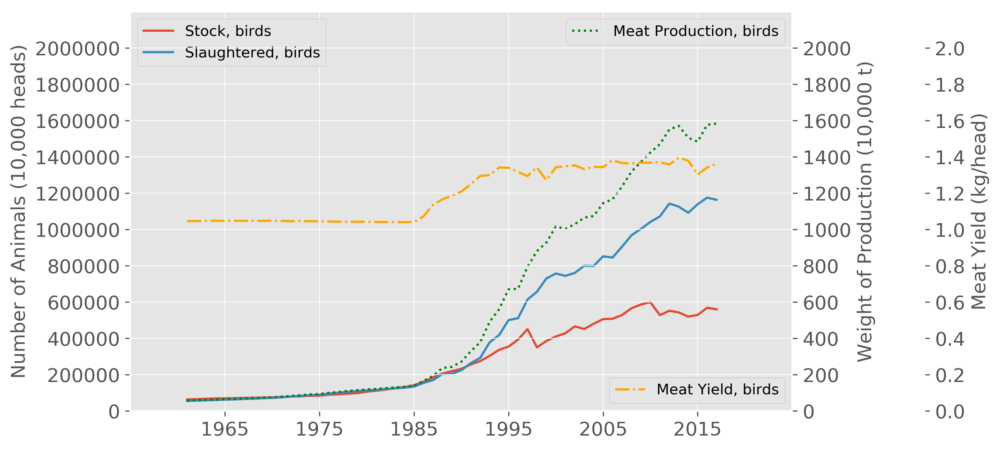

In [63]:
items = ['pig', 'cattle', 'goat & sheep', 'birds']
for i in items:
    drawOutputs(df, 'China, mainland', i)

,Year,"Marine, capture","Marine, aquac.","Freshwater, capture","Freshwater, aquac."
17,1978,314.50,45.30,29.50,76.20
19,1980,281.30,44.41,33.97,90.02
24,1985,348.51,71.23,47.64,237.77
25,1986,389.60,85.80,53.80,294.40
26,1987,438.20,110.00,60.00,347.20


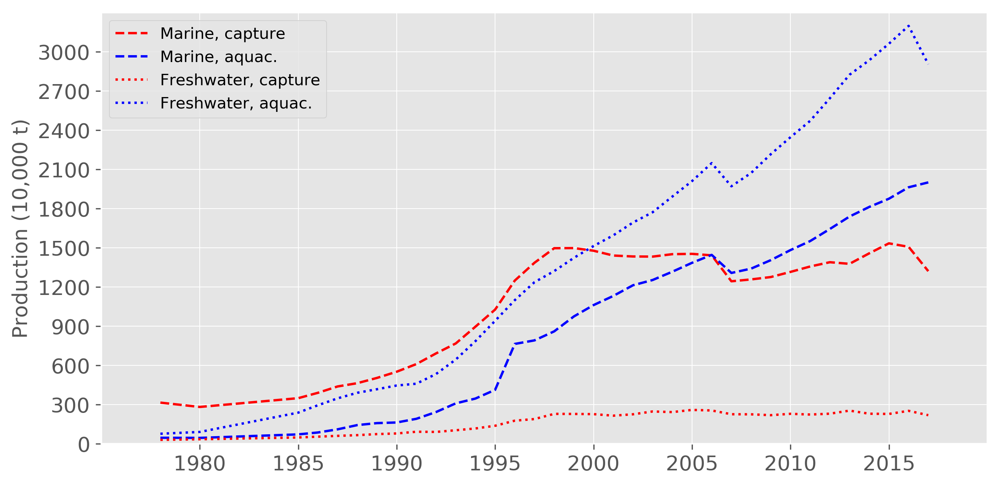

In [36]:
items = ['Marine, capture', 'Marine, aquac.', 'Freshwater, capture', 'Freshwater, aquac.']

df_=df.copy()
res = df_[df_['Area']=='China, mainland'][['Year']+items]
res = res.dropna()

display(res.head())

fig, ax = plt.subplots(figsize=(10,5), dpi = 300)
colors=['r','b','r','b']
linestyles=['--','--',':',':']
n=0
for i in items:
    plt.plot(res['Year'],res[i],c=colors[n],ls=linestyles[n])
    n+=1
ax=plt.gca()
plt.legend()
X_step=5
setX_quant(ax, range(1980,2020,X_step), X_step)
setY_quant(ax, res[items].values.max(), 'Production (10,000 t)')

img='./results/img/'+'CN_AnimalProduction_'+'Capture and Aquac.png'
bbox = matplotlib.transforms.Bbox([[-0, -0], [10, 5]])
fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)